In [1]:
using Pkg

In [2]:
ENV["PYTHON"] = "/home/tung/anaconda3/envs/celldancer/bin/python3"

"/home/tung/anaconda3/envs/celldancer/bin/python3"

In [3]:
Pkg.build("PyCall")

    Building Conda ─→ `~/.julia/scratchspaces/44cfe95a-1eb2-52ea-b672-e2afdf69b78f/b19db3927f0db4151cb86d073689f2428e524576/build.log`
    Building PyCall → `~/.julia/scratchspaces/44cfe95a-1eb2-52ea-b672-e2afdf69b78f/9816a3826b0ebf49ab4926e2b18842ad8b5c8f04/build.log`


In [4]:
using JuloVelo
using Plots

In [5]:
adata_rna = read_adata("data/JuloVelo_rna.h5ad")
adata_atac = read_adata("data/JuloVelo_atac.h5ad")

AnnData object 3644 ✕ 1959

In [6]:
adata_rna.uns["iroot"] = 11

11

In [7]:
normalize(adata_rna, adata_atac)

(AnnData object 3644 ✕ 1959, AnnData object 3644 ✕ 1959)

In [8]:
filter_and_gene_kinetics_predetermination(adata_rna, adata_atac)

[ Info: 1020 genes are filtered due to low correlation between norm_u and norm_s
[ Info: See adata.var[!, "bad_correlation_genes"] for details
[ Info: 42 genes are filtered due to bad kinetics
[ Info: See adata_rna.var[!, "bad_kinetics_genes"] for details
[ Info: 897 genes are used to infer velocity
[ Info: See adata_rna.var[!, "train_genes"] for details


(AnnData object 3644 ✕ 1959, AnnData object 3644 ✕ 1959)

In [9]:
reshape_data(adata_rna)

[ Info: Data is reshaped to (2, 3644, 897)


AnnData object 3644 ✕ 1959

In [10]:
Kinetics = build_velocity_model(adata_rna)

[ Info: Successfully initialize velocity model


Chain(
  SpatialDense(2 => 100, depth = 897, leakyrelu),  # 269_100 parameters
  SpatialDense(100 => 100, depth = 897, leakyrelu),  # 9_059_700 parameters
  SpatialDense(100 => 3, depth = 897, σ),  # 271_791 parameters
)                   # Total: 6 arrays, 9_600_591 parameters, 36.624 MiB.

In [11]:
density_sampling(adata_rna)

[ Info: Sample 2400 cells


AnnData object 3644 ✕ 1959

In [12]:
train(adata_rna, Kinetics)

[ Info: Training on gpu
[ Info: Training with Adam Optimizer
[ Info: TensorBoard logging at "/media/data/bmi111/KuanChiun/JuloVelo/thesis/results/Mouse_E18/Multiome/saves/"
[ Info: Start training


Epoch: 0  Train: (cos_loss = 76820.09f0, penalty = 3376.6355f0, AvgMeanCos = 0.9643f0)
Epoch: 1  Train: (cos_loss = 75915.59f0, penalty = 3376.453f0, AvgMeanCos = 0.9647f0)
Epoch: 2  Train: (cos_loss = 75112.99f0, penalty = 3376.2695f0, AvgMeanCos = 0.9651f0)
Epoch: 3  Train: (cos_loss = 74373.586f0, penalty = 3376.0857f0, AvgMeanCos = 0.9655f0)
Epoch: 4  Train: (cos_loss = 73674.88f0, penalty = 3375.9011f0, AvgMeanCos = 0.9658f0)
Epoch: 5  Train: (cos_loss = 72995.3f0, penalty = 3375.7173f0, AvgMeanCos = 0.9661f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 6  Train: (cos_loss = 72346.71f0, penalty = 3375.5325f0, AvgMeanCos = 0.9664f0)
Epoch: 7  Train: (cos_loss = 71710.414f0, penalty = 3375.3457f0, AvgMeanCos = 0.9667f0)
Epoch: 8  Train: (cos_loss = 71083.03f0, penalty = 3375.1597f0, AvgMeanCos = 0.967f0)
Epoch: 9  Train: (cos_loss = 70468.16f0, penalty = 3374.9717f0, AvgMeanCos = 0.9673f0)
Epoch: 10  Train: (cos_loss = 69853.94f0, penalty = 3374.7827f0, AvgMeanCos = 0.9676f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 11  Train: (cos_loss = 69242.78f0, penalty = 3374.5923f0, AvgMeanCos = 0.9678f0)
Epoch: 12  Train: (cos_loss = 68644.02f0, penalty = 3374.4011f0, AvgMeanCos = 0.9681f0)
Epoch: 13  Train: (cos_loss = 68061.84f0, penalty = 3374.2092f0, AvgMeanCos = 0.9684f0)
Epoch: 14  Train: (cos_loss = 67500.18f0, penalty = 3374.016f0, AvgMeanCos = 0.9686f0)
Epoch: 15  Train: (cos_loss = 66979.91f0, penalty = 3373.8215f0, AvgMeanCos = 0.9689f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 16  Train: (cos_loss = 66477.18f0, penalty = 3373.6252f0, AvgMeanCos = 0.9691f0)
Epoch: 17  Train: (cos_loss = 66004.37f0, penalty = 3373.4272f0, AvgMeanCos = 0.9693f0)
Epoch: 18  Train: (cos_loss = 65561.91f0, penalty = 3373.2285f0, AvgMeanCos = 0.9695f0)
Epoch: 19  Train: (cos_loss = 65149.566f0, penalty = 3373.0276f0, AvgMeanCos = 0.9697f0)
Epoch: 20  Train: (cos_loss = 64763.707f0, penalty = 3372.8252f0, AvgMeanCos = 0.9699f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 21  Train: (cos_loss = 64393.07f0, penalty = 3372.621f0, AvgMeanCos = 0.9701f0)
Epoch: 22  Train: (cos_loss = 64044.55f0, penalty = 3372.4165f0, AvgMeanCos = 0.9703f0)
Epoch: 23  Train: (cos_loss = 63711.69f0, penalty = 3372.2097f0, AvgMeanCos = 0.9704f0)
Epoch: 24  Train: (cos_loss = 63394.9f0, penalty = 3372.0017f0, AvgMeanCos = 0.9706f0)
Epoch: 25  Train: (cos_loss = 63098.836f0, penalty = 3371.7925f0, AvgMeanCos = 0.9707f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 26  Train: (cos_loss = 62818.84f0, penalty = 3371.5828f0, AvgMeanCos = 0.9708f0)
Epoch: 27  Train: (cos_loss = 62557.23f0, penalty = 3371.3716f0, AvgMeanCos = 0.9709f0)
Epoch: 28  Train: (cos_loss = 62313.67f0, penalty = 3371.1597f0, AvgMeanCos = 0.9711f0)
Epoch: 29  Train: (cos_loss = 62082.895f0, penalty = 3370.9473f0, AvgMeanCos = 0.9712f0)
Epoch: 30  Train: (cos_loss = 61854.754f0, penalty = 3370.7332f0, AvgMeanCos = 0.9713f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 31  Train: (cos_loss = 61636.32f0, penalty = 3370.5188f0, AvgMeanCos = 0.9714f0)
Epoch: 32  Train: (cos_loss = 61434.523f0, penalty = 3370.3037f0, AvgMeanCos = 0.9715f0)
Epoch: 33  Train: (cos_loss = 61246.24f0, penalty = 3370.0876f0, AvgMeanCos = 0.9716f0)
Epoch: 34  Train: (cos_loss = 61070.824f0, penalty = 3369.87f0, AvgMeanCos = 0.9716f0)
Epoch: 35  Train: (cos_loss = 60901.67f0, penalty = 3369.6523f0, AvgMeanCos = 0.9717f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 36  Train: (cos_loss = 60732.54f0, penalty = 3369.433f0, AvgMeanCos = 0.9718f0)
Epoch: 37  Train: (cos_loss = 60577.496f0, penalty = 3369.2136f0, AvgMeanCos = 0.9719f0)
Epoch: 38  Train: (cos_loss = 60418.49f0, penalty = 3368.9937f0, AvgMeanCos = 0.9719f0)
Epoch: 39  Train: (cos_loss = 60271.188f0, penalty = 3368.7725f0, AvgMeanCos = 0.972f0)
Epoch: 40  Train: (cos_loss = 60133.305f0, penalty = 3368.55f0, AvgMeanCos = 0.9721f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 41  Train: (cos_loss = 60000.93f0, penalty = 3368.3276f0, AvgMeanCos = 0.9721f0)
Epoch: 42  Train: (cos_loss = 59870.86f0, penalty = 3368.1035f0, AvgMeanCos = 0.9722f0)
Epoch: 43  Train: (cos_loss = 59744.15f0, penalty = 3367.879f0, AvgMeanCos = 0.9722f0)
Epoch: 44  Train: (cos_loss = 59620.4f0, penalty = 3367.6523f0, AvgMeanCos = 0.9723f0)
Epoch: 45  Train: (cos_loss = 59506.133f0, penalty = 3367.4243f0, AvgMeanCos = 0.9724f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 46  Train: (cos_loss = 59393.445f0, penalty = 3367.1973f0, AvgMeanCos = 0.9724f0)
Epoch: 47  Train: (cos_loss = 59287.89f0, penalty = 3366.9685f0, AvgMeanCos = 0.9725f0)
Epoch: 48  Train: (cos_loss = 59180.504f0, penalty = 3366.7388f0, AvgMeanCos = 0.9725f0)
Epoch: 49  Train: (cos_loss = 59077.746f0, penalty = 3366.508f0, AvgMeanCos = 0.9726f0)
Epoch: 50  Train: (cos_loss = 58978.344f0, penalty = 3366.2769f0, AvgMeanCos = 0.9726f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 51  Train: (cos_loss = 58882.465f0, penalty = 3366.0452f0, AvgMeanCos = 0.9726f0)
Epoch: 52  Train: (cos_loss = 58789.02f0, penalty = 3365.8125f0, AvgMeanCos = 0.9727f0)
Epoch: 53  Train: (cos_loss = 58702.293f0, penalty = 3365.5796f0, AvgMeanCos = 0.9727f0)
Epoch: 54  Train: (cos_loss = 58617.285f0, penalty = 3365.3457f0, AvgMeanCos = 0.9728f0)
Epoch: 55  Train: (cos_loss = 58533.945f0, penalty = 3365.111f0, AvgMeanCos = 0.9728f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 56  Train: (cos_loss = 58449.637f0, penalty = 3364.8765f0, AvgMeanCos = 0.9728f0)
Epoch: 57  Train: (cos_loss = 58370.77f0, penalty = 3364.6409f0, AvgMeanCos = 0.9729f0)
Epoch: 58  Train: (cos_loss = 58290.9f0, penalty = 3364.4053f0, AvgMeanCos = 0.9729f0)
Epoch: 59  Train: (cos_loss = 58211.36f0, penalty = 3364.1685f0, AvgMeanCos = 0.973f0)
Epoch: 60  Train: (cos_loss = 58132.754f0, penalty = 3363.932f0, AvgMeanCos = 0.973f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 61  Train: (cos_loss = 58056.645f0, penalty = 3363.6956f0, AvgMeanCos = 0.973f0)
Epoch: 62  Train: (cos_loss = 57983.38f0, penalty = 3363.4585f0, AvgMeanCos = 0.9731f0)
Epoch: 63  Train: (cos_loss = 57910.33f0, penalty = 3363.2207f0, AvgMeanCos = 0.9731f0)
Epoch: 64  Train: (cos_loss = 57841.004f0, penalty = 3362.9832f0, AvgMeanCos = 0.9731f0)
Epoch: 65  Train: (cos_loss = 57771.97f0, penalty = 3362.745f0, AvgMeanCos = 0.9732f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 66  Train: (cos_loss = 57707.23f0, penalty = 3362.5068f0, AvgMeanCos = 0.9732f0)
Epoch: 67  Train: (cos_loss = 57643.367f0, penalty = 3362.268f0, AvgMeanCos = 0.9732f0)
Epoch: 68  Train: (cos_loss = 57584.523f0, penalty = 3362.0283f0, AvgMeanCos = 0.9733f0)
Epoch: 69  Train: (cos_loss = 57522.88f0, penalty = 3361.7893f0, AvgMeanCos = 0.9733f0)
Epoch: 70  Train: (cos_loss = 57458.715f0, penalty = 3361.5493f0, AvgMeanCos = 0.9733f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 71  Train: (cos_loss = 57394.516f0, penalty = 3361.309f0, AvgMeanCos = 0.9733f0)
Epoch: 72  Train: (cos_loss = 57331.156f0, penalty = 3361.0688f0, AvgMeanCos = 0.9734f0)
Epoch: 73  Train: (cos_loss = 57270.906f0, penalty = 3360.8276f0, AvgMeanCos = 0.9734f0)
Epoch: 74  Train: (cos_loss = 57212.37f0, penalty = 3360.587f0, AvgMeanCos = 0.9734f0)
Epoch: 75  Train: (cos_loss = 57156.168f0, penalty = 3360.3447f0, AvgMeanCos = 0.9735f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 76  Train: (cos_loss = 57100.098f0, penalty = 3360.1023f0, AvgMeanCos = 0.9735f0)
Epoch: 77  Train: (cos_loss = 57044.945f0, penalty = 3359.8604f0, AvgMeanCos = 0.9735f0)
Epoch: 78  Train: (cos_loss = 56988.57f0, penalty = 3359.618f0, AvgMeanCos = 0.9735f0)
Epoch: 79  Train: (cos_loss = 56935.832f0, penalty = 3359.3755f0, AvgMeanCos = 0.9736f0)
Epoch: 80  Train: (cos_loss = 56882.33f0, penalty = 3359.1323f0, AvgMeanCos = 0.9736f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 81  Train: (cos_loss = 56830.535f0, penalty = 3358.8896f0, AvgMeanCos = 0.9736f0)
Epoch: 82  Train: (cos_loss = 56781.094f0, penalty = 3358.6472f0, AvgMeanCos = 0.9736f0)
Epoch: 83  Train: (cos_loss = 56727.72f0, penalty = 3358.4033f0, AvgMeanCos = 0.9736f0)
Epoch: 84  Train: (cos_loss = 56675.9f0, penalty = 3358.16f0, AvgMeanCos = 0.9737f0)
Epoch: 85  Train: (cos_loss = 56627.156f0, penalty = 3357.9155f0, AvgMeanCos = 0.9737f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 86  Train: (cos_loss = 56578.023f0, penalty = 3357.6711f0, AvgMeanCos = 0.9737f0)
Epoch: 87  Train: (cos_loss = 56530.938f0, penalty = 3357.4255f0, AvgMeanCos = 0.9737f0)
Epoch: 88  Train: (cos_loss = 56484.96f0, penalty = 3357.1804f0, AvgMeanCos = 0.9738f0)
Epoch: 89  Train: (cos_loss = 56439.617f0, penalty = 3356.9353f0, AvgMeanCos = 0.9738f0)
Epoch: 90  Train: (cos_loss = 56392.53f0, penalty = 3356.69f0, AvgMeanCos = 0.9738f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 91  Train: (cos_loss = 56348.703f0, penalty = 3356.4443f0, AvgMeanCos = 0.9738f0)
Epoch: 92  Train: (cos_loss = 56305.746f0, penalty = 3356.1997f0, AvgMeanCos = 0.9738f0)
Epoch: 93  Train: (cos_loss = 56261.234f0, penalty = 3355.9543f0, AvgMeanCos = 0.9739f0)
Epoch: 94  Train: (cos_loss = 56215.64f0, penalty = 3355.7085f0, AvgMeanCos = 0.9739f0)
Epoch: 95  Train: (cos_loss = 56172.0f0, penalty = 3355.462f0, AvgMeanCos = 0.9739f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 96  Train: (cos_loss = 56129.434f0, penalty = 3355.2166f0, AvgMeanCos = 0.9739f0)
Epoch: 97  Train: (cos_loss = 56086.523f0, penalty = 3354.9702f0, AvgMeanCos = 0.9739f0)
Epoch: 98  Train: (cos_loss = 56045.637f0, penalty = 3354.7236f0, AvgMeanCos = 0.974f0)
Epoch: 99  Train: (cos_loss = 56005.812f0, penalty = 3354.4773f0, AvgMeanCos = 0.974f0)
Epoch: 100  Train: (cos_loss = 55965.35f0, penalty = 3354.2307f0, AvgMeanCos = 0.974f0)


[ Info: Model is saved in saves/Kinetics.bson


Chain(
  SpatialDense(2 => 100, depth = 897, leakyrelu),  # 269_100 parameters
  SpatialDense(100 => 100, depth = 897, leakyrelu),  # 9_059_700 parameters
  SpatialDense(100 => 3, depth = 897, σ),  # 271_791 parameters
)                   # Total: 6 arrays, 9_600_591 parameters, 36.624 MiB.

In [13]:
velocity_estimation(adata_rna, Kinetics);

[ Info: Velocity saved in adata.uns["velocity"]
[ Info: kinetics saved in adata.uns["kinetics"]


In [14]:
compute_cell_velocity(adata_rna);

In [40]:
estimate_pseudotime(adata_rna, 3, n_repeat = 3; celltype = "celltype");

[ Info: Start estimate pseudotime, it may take a long time.
Generating Trajectories: 100%|████████| 10932/10932 [00:00<00:00, 11447.11it/s]


Pseudo random number generator seeds are set to:  [0, 1, 2]
There are 3 clusters.
[0 1 2]
--- 12.864575862884521 seconds ---


In [41]:
merge_multiome_adata(adata_rna, adata_atac)

(AnnData object 3644 ✕ 1959, AnnData object 3644 ✕ 1959)

In [42]:
write_adata(adata_rna, filename = "data/JuloVelo")

# Plot figure

## Gene kinetics

In [18]:
palattes = Dict(
    "Deeper Layer"=>"#1f77b4",
    "Ependymal cells"=>"#ff7f0e",
    "IPC"=>"#2ca02c",
    "RG, Astro, OPC"=>"#d62728",
    "Subplate"=>"#9467bd",
    "Upper Layer"=>"#8c564b",
    "V-SVZ"=>"#e377c2"
)

Dict{String, String} with 7 entries:
  "Deeper Layer"    => "#1f77b4"
  "IPC"             => "#2ca02c"
  "RG, Astro, OPC"  => "#d62728"
  "Subplate"        => "#9467bd"
  "V-SVZ"           => "#e377c2"
  "Ependymal cells" => "#ff7f0e"
  "Upper Layer"     => "#8c564b"

In [19]:
function gene_plot(x, x̂; part = 20)
    x_range = Array(range(0, 1, part))
    y_range = Array(range(0, 1, part))
    
    arrow_vector = Array{Float32}(undef, 0, 2)
    point_vector = Array{Float32}(undef, 0, 2)
    
    for i in 1:part - 1
        for j in 1:part - 1
            index = intersect(findall(k -> (k .>= x_range[i]) & (k .<= x_range[i + 1]), x[2, :]), 
            findall(k -> (k .>= y_range[j]) & (k .<= y_range[j + 1]), x[1, :]))
            
            if length(index) > 0
                selected = x̂[:, index]
            else
                continue
            end
            
            selected_vector = sum(selected, dims = 2) ./ size(selected, 2)
            scale = maximum(abs, selected_vector) / (x_range[i + 1] - x_range[i])
            selected_vector = selected_vector ./ scale
            #println(selected_vector)
            xcenter = (x_range[i + 1] + x_range[i]) / 2
            ycenter = (y_range[j + 1] + y_range[j]) / 2
            xarrow = selected_vector[2]
            yarrow = selected_vector[1]
            
            arrow_vector = vcat(arrow_vector, vec([xarrow, yarrow])')
            point_vector = vcat(point_vector, vec([xcenter, ycenter])')
        end
    end
    
    return arrow_vector, point_vector
end

gene_plot (generic function with 1 method)

In [20]:
theme(:vibrant, framestyle = :zerolines, grid = true, markersize = 3, linewidth = 1.4, palette = :tab20) 

In [21]:
GR.setarrowsize(0.5)

In [22]:
X = adata_rna.uns["X"];
velocity = adata_rna.uns["velocity"]
genes = adata_rna.var_names[adata_rna.var[!, "train_genes"]]
celltype = adata_rna.obs[!, "celltype"]
labels = sort(unique(celltype));

In [23]:
idx = findfirst(x -> x == "Eomes", genes) # 

872

In [24]:
arrow_vector, point_vector = gene_plot(X[:, :, idx], velocity[:, :, idx])

([-0.05263157894736842 -0.013614079575068069; 0.022886860058722692 -0.05263157894736842; … ; -0.008390210789611247 -0.052631578947368474; -0.012687625974350285 -0.052631578947368474], [0.02631578947368421 0.02631578947368421; 0.02631578947368421 0.07894736842105263; … ; 0.868421052631579 0.763157894736842; 0.9736842105263157 0.8157894736842105])

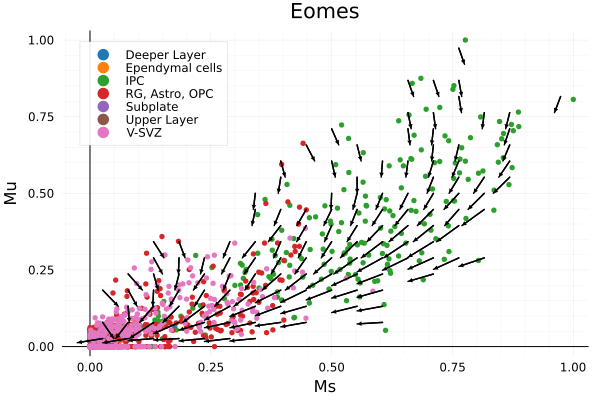

In [25]:
p1 = plot()
for label in labels
    scatter!(X[2, celltype .== label, idx], X[1, celltype .== label, idx], label = label, xlabel = "Ms", ylabel = "Mu", color = palattes[label], title = genes[idx])
end
quiver!(point_vector[:, 1], point_vector[:, 2], quiver = (arrow_vector[:, 1], arrow_vector[:, 2]), arrow = arrow(:closed), color = "#000000")

In [26]:
idx2 = findfirst(x -> x == "Gria2", genes)

523

In [27]:
arrow_vector1, point_vector1 = gene_plot(X[:, :, idx2], velocity[:, :, idx2])

([0.003261540230973307 0.05263157894736842; 0.019283746935074886 0.05263157894736842; … ; 0.05263157894736837 0.007068396265942641; -0.00820844268032681 -0.05263157894736847], [0.02631578947368421 0.02631578947368421; 0.02631578947368421 0.07894736842105263; … ; 0.9210526315789473 0.9210526315789473; 0.9736842105263157 0.868421052631579])

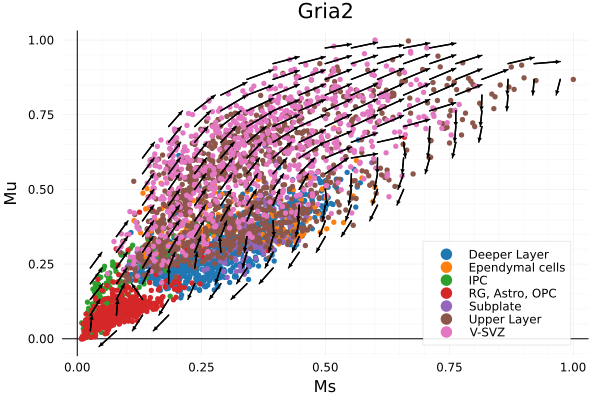

In [28]:
p2 = plot()
for label in labels
    scatter!(X[2, celltype .== label, idx2], X[1, celltype .== label, idx2], label = label, xlabel = "Ms", ylabel = "Mu", color = palattes[label], title = genes[idx2])
end
quiver!(point_vector1[:, 1], point_vector1[:, 2], quiver = (arrow_vector1[:, 1], arrow_vector1[:, 2]), arrow = arrow(:closed), color = "#000000")

In [29]:
idx3 = findfirst(x -> x == "Tle4", genes)

403

In [30]:
arrow_vector2, point_vector2 = gene_plot(X[:, :, idx3], velocity[:, :, idx3])

([0.016351877507843296 0.05263157894736842; 0.0268117096854236 0.05263157894736842; … ; 0.052631578947368474 0.04962056048066956; 0.052631578947368474 0.043411113827529074], [0.02631578947368421 0.02631578947368421; 0.02631578947368421 0.07894736842105263; … ; 0.9736842105263157 0.8157894736842105; 0.9736842105263157 0.868421052631579])

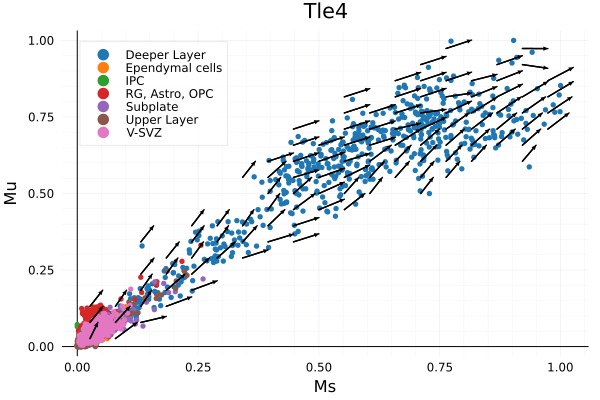

In [31]:
p3 = plot()
for label in labels
    scatter!(X[2, celltype .== label, idx3], X[1, celltype .== label, idx3], label = label, xlabel = "Ms", ylabel = "Mu", color = palattes[label], title = genes[idx3])
end
quiver!(point_vector2[:, 1], point_vector2[:, 2], quiver = (arrow_vector2[:, 1], arrow_vector2[:, 2]), arrow = arrow(:closed), color = "#000000")

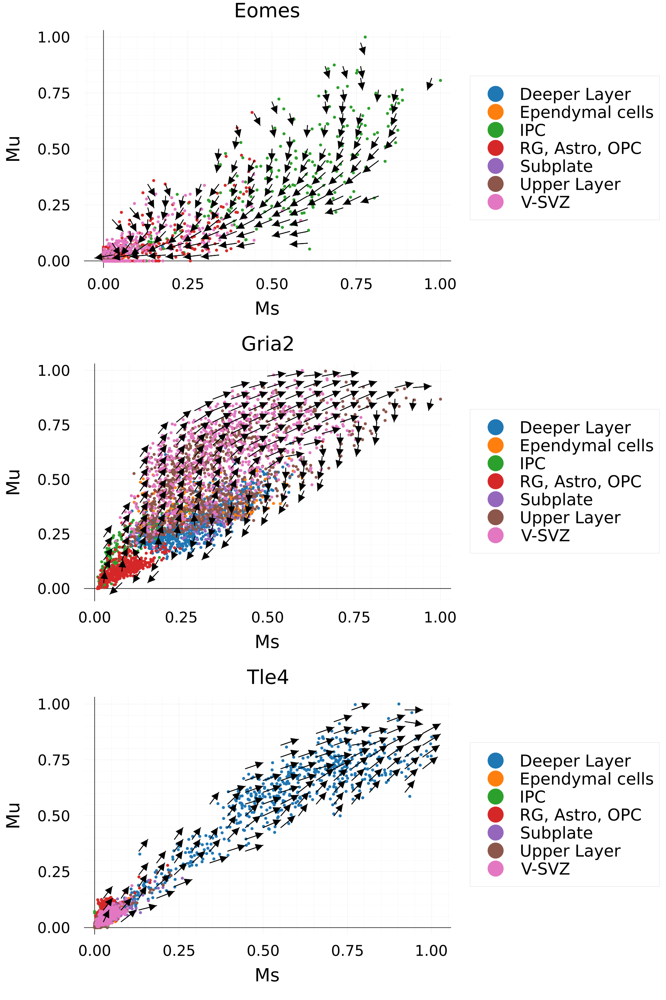

In [32]:
p = plot(p1, p2, p3, layout = (3, 1), size = (1200, 1800), dpi = 150, left_margins = 1.3Plots.cm, bottom_margins = 0.5Plots.cm, 
    legendfontsize = 20, xtickfontsize = 18, ytickfontsize = 18, xguidefontsize = 22, yguidefontsize = 22, titlefontsize = 24, legend = :outerright)

In [33]:
savefig(p, "figure/JuloVelo_velocity_vector.png")

"/media/data/bmi111/KuanChiun/JuloVelo/thesis/results/Mouse_E18/Multiome/figure/JuloVelo_velocity_vector.png"

## Kinetics embedding

In [34]:
kinetics_embedding(adata_rna; basis = "umap");

In [35]:
embedding = adata_rna.obsm["kinetics_umap"];

In [36]:
celltype = adata_rna.obs[!, "celltype"]
labels = sort(unique(celltype))

7-element Vector{String}:
 "Deeper Layer"
 "Ependymal cells"
 "IPC"
 "RG, Astro, OPC"
 "Subplate"
 "Upper Layer"
 "V-SVZ"

In [37]:
theme(:vibrant, framestyle = :axes, grid = true, markersize = 3, linewidth = 1.4, palette = :tab20) 

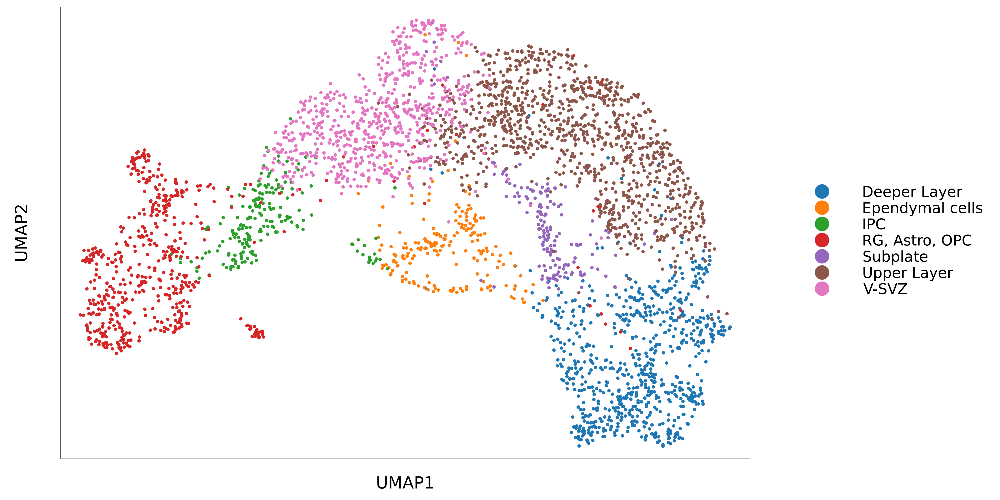

In [38]:
p = scatter(size = (1600, 800), fg_legend = :transparent, left_margin = 1.8Plots.cm, bottom_margin = 1.0Plots.cm, dpi = 300) #
for label in labels
    scatter!(embedding[celltype .== label, 1], embedding[celltype .== label, 2], label = label, legend=:outerright, legendfontsize = 16, color = palattes[label]
        , xlabel = "UMAP1", ylabel = "UMAP2", xtick = nothing, yticks = nothing, xguidefontsize = 18, yguidefontsize = 18)
end
p

In [39]:
savefig(p, "figure/erythroid_kinetic_embedding.png")

"/media/data/bmi111/KuanChiun/JuloVelo/thesis/results/Mouse_E18/Multiome/figure/erythroid_kinetic_embedding.png"